<a href="https://colab.research.google.com/github/WuDianQiBian/ml-course/blob/master/notebooks/ch02_python_basics/sec05_numpy_2_answer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NumPy 2 思考题

<p align="center">
  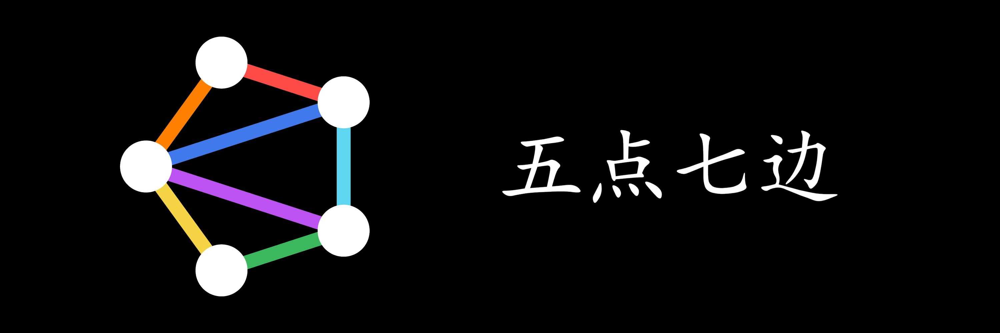
</p>


# 第八章：思考题

这张图片由 **52 张扑克牌** 组成，按 **4 行 × 13 列** 排布。
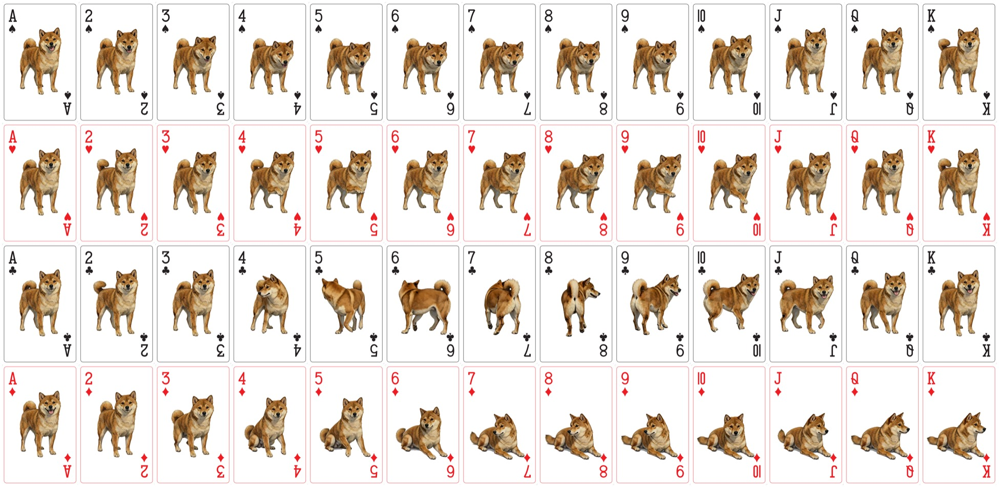


**问题：** 如何把这些扑克牌同时上下、左右颠倒？

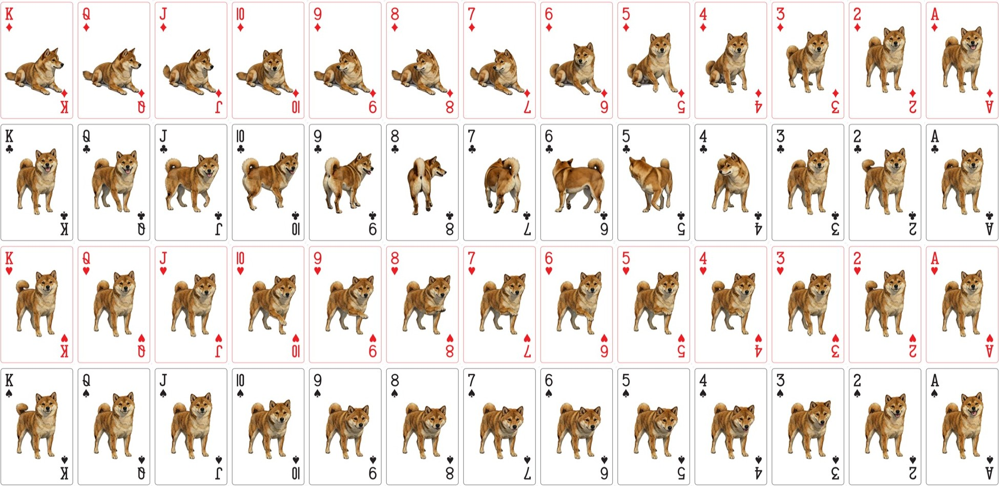

**提示:**
1. 不要逐像素处理。
2. 能否只用 `reshape` 和 `slicing`？
3. 读取扑克牌图片代码如下:

# 答案

In [1]:
# @title 辅助函数
import numpy as np
from PIL import Image
from IPython.display import display

!wget -q -nc --directory-prefix=downloads https://raw.githubusercontent.com/WuDianQiBian/ml-course/master/notebooks/ch02_python_basics/assets/playing_cards_grid_4x13_w3900.jpg

def read_image(path):
    return np.asarray(Image.open(path)).copy()

def display_image(img):
    display(Image.fromarray(img))

img.shape=(1904, 3900, 3)


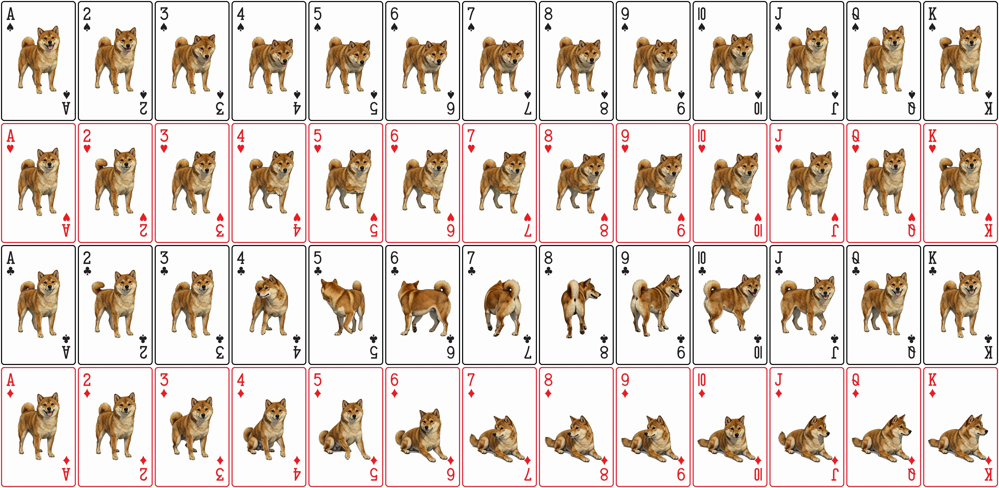

In [2]:
img = read_image("downloads/playing_cards_grid_4x13_w3900.jpg")
H, W, C = img.shape

print(f"{img.shape=}")
display_image(img)

In [3]:
# 从像素视角切换到牌视角: (H, W, C) -> (4, card_h, 13, card_w, C)
card_h = H // 4
card_w = W // 13
cards = img.reshape(4, card_h, 13, card_w, C)

print(f"{cards.shape=}")

cards.shape=(4, 476, 13, 300, 3)


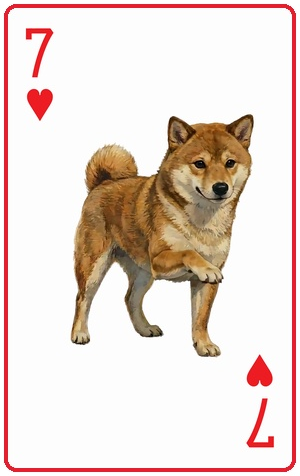

In [4]:
# 拿出一张牌展示:
display_image(cards[1, :, 6, :, :])

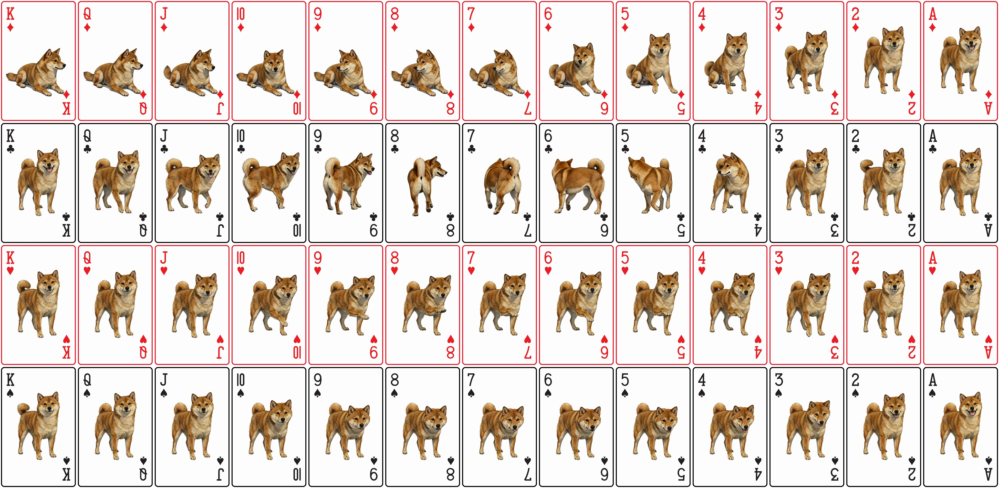

In [5]:
# 在牌的维度上做反向 slicing（第0维和第2维）
cards_flipped = cards[::-1,  # 第0维翻转
                      :,
                      ::-1,  # 第2维翻转
                      :,
                      :]

# 还原回像素视角
result = cards_flipped.reshape(H, W, C)
display_image(result)